Run all the cells and make changes to only the allowed cells. Do not change the code in the restricted region

In [35]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import shutil

In [36]:
dataset_path = "C:/Users/Azeem/Desktop/Dataset"

t_path = dataset_path

# Change this code


In [37]:
#I think that i have mangae the folders by my self, so also written this code.
def move_folders(source, destination):
    # Ensure the destination path exists
    if not os.path.exists(destination):
        os.makedirs(destination)

    # Iterate through the items in the source directory
    for item in os.listdir(source):
        item_path = os.path.join(source, item)

        # Move folders only
        if os.path.isdir(item_path):
            dest_folder_path = os.path.join(destination, item)
            
            # Move the folder to the destination
            shutil.move(item_path, dest_folder_path)
    
l = os.listdir(t_path)

if (len(l) < 4):
    print("Files Are Arranged now\n")
else:
    os.chdir(t_path)
    types = os.listdir()

    test_fldr = f"{t_path}\\test_set"
    train_fldr = f"{t_path}\\train_set"

    os.mkdir(test_fldr)
    os.mkdir(train_fldr)
    

    for folder in types:
        os.chdir(f"{t_path}\\{folder}\\test_set")
        l = os.listdir()
        for j in l:
            os.rename(j, f"{j}_{folder.lower()}")

        os.chdir(f"{t_path}\\{folder}\\train_set")
        l = os.listdir()
        for j in l:
            os.rename(j, f"{j}_{folder.lower()}")

    for folder in types:
        move_folders(f"{t_path}\\{folder}\\test_set", test_fldr)

        move_folders(f"{t_path}\\{folder}\\train_set", train_fldr)

    for folder in types:
        os.remove(f"{t_path}\\folder")


Files Are Arranged now



In [38]:
train_dir = os.path.join(dataset_path, 'train_set')
test_dir = os.path.join(dataset_path, 'test_set')

In [39]:
train_data = ImageDataGenerator(rescale=1.0/255) 
test_data = ImageDataGenerator(rescale=1.0/255)


train_generator = train_data.flow_from_directory(
    train_dir,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'    
)

test_generator = test_data.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

print("Classes found in the dataset:", train_generator.class_indices)

# Do not change this code

Found 74317 images belonging to 22 classes.
Found 24981 images belonging to 22 classes.
Classes found in the dataset: {'anthracnose_cashew': 0, 'bacterial blight_cassava': 1, 'brown spot_cassava': 2, 'fall armyworm_maize': 3, 'grasshoper_maize': 4, 'green mite_cassava': 5, 'gumosis_cashew': 6, 'healthy_cashew': 7, 'healthy_cassava': 8, 'healthy_maize': 9, 'healthy_tomato': 10, 'leaf beetle_maize': 11, 'leaf blight_maize': 12, 'leaf blight_tomato': 13, 'leaf curl_tomato': 14, 'leaf miner_cashew': 15, 'leaf spot_maize': 16, 'mosaic_cassava': 17, 'red rust_cashew': 18, 'septoria leaf spot_tomato': 19, 'streak virus_maize': 20, 'verticulium wilt_tomato': 21}


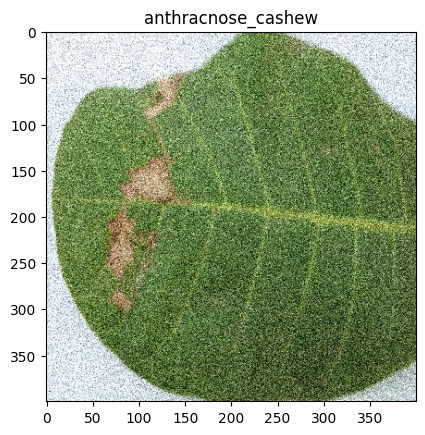

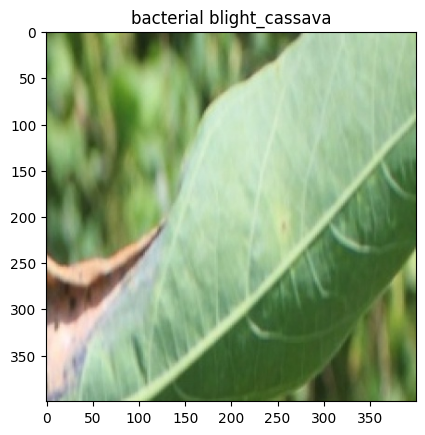

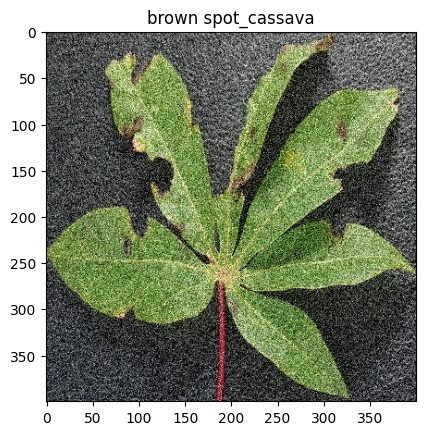

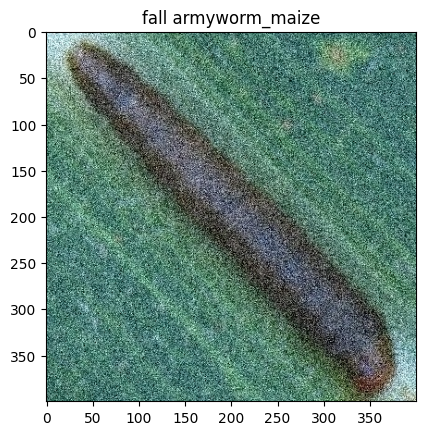

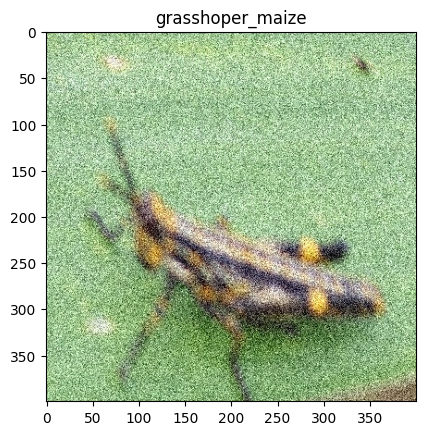

...

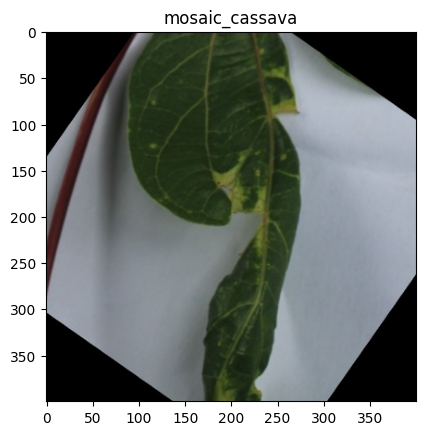

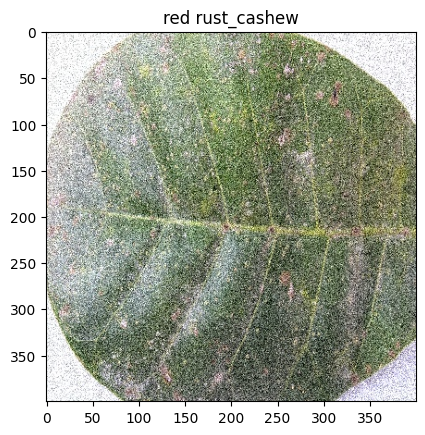

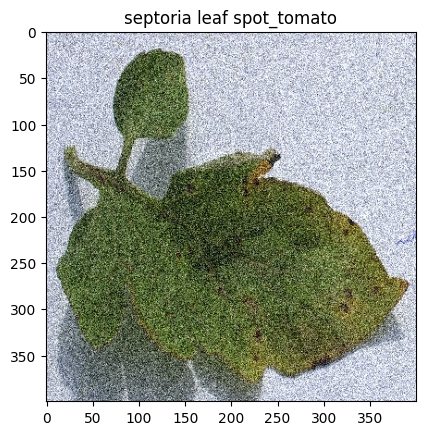

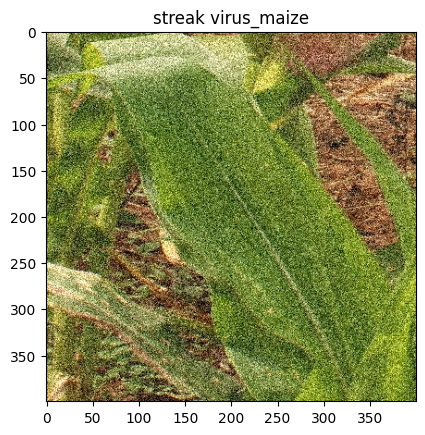

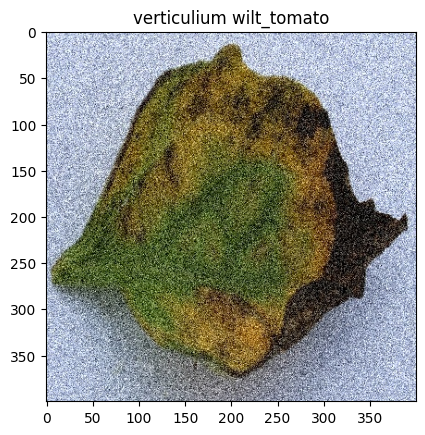

In [40]:
# Write the code to display one image of all the 22 classes.

from tensorflow.keras.preprocessing.image import load_img
import matplotlib.pyplot as plt

class_indices = train_generator.class_indices
class_names = list(class_indices.keys())

images_per_class= {}

for class_name in class_names:
    class_dir = os.path.join(train_dir,class_name)
    img_files = os.listdir(class_dir)
    images_per_class[class_name] = os.path.join(class_dir, img_files[0])

for class_name, img_path in images_per_class.items():
    img = load_img(img_path)
    plt.imshow(img)
    plt.title(class_name)
    plt.show()

Run all the cells and the output must be clearly visible for all the cells.